In [2]:
# Importing necessary libraries
# !pip install imblearn

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
import os

In [3]:
current_path = os.getcwd()

In [4]:
# Loading cleaned datasets

collision_df = pd.read_parquet(f"{current_path}/data/processed data/collision_data.parquet")
esa_df = pd.read_parquet(f"{current_path}/data/processed data/esa_df_modeling.parquet")
full_satcat_df = pd.read_parquet(f"{current_path}/data/processed data/satcat_df.parquet")
lost_objects_df = pd.read_parquet(f"{current_path}/data/processed data/lost_objects.parquet")
loe_objects_df = pd.read_parquet(f"{current_path}/data/processed data/leo_objects.parquet")

In [6]:
# Printing summary of each dataset
print(esa_df.info())
print(full_satcat_df.info())
print(lost_objects_df.info())
print(collision_df.info())
print(loe_objects_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68124 entries, 0 to 68123
Data columns (total 16 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   cosparId                    67666 non-null  object 
 1   name                        67390 non-null  object 
 2   objectClass                 68124 non-null  object 
 3   mass                        34050 non-null  float64
 4   shape                       33235 non-null  object 
 5   width                       18430 non-null  float64
 6   height                      32680 non-null  float64
 7   depth                       18403 non-null  float64
 8   diameter                    14809 non-null  float64
 9   span                        32380 non-null  float64
 10  xSectMax                    32980 non-null  float64
 11  xSectMin                    32980 non-null  float64
 12  xSectAvg                    32920 non-null  float64
 13  firstEpoch                  640

**ESA Dataset (esa_df)**

In [7]:
# Dropping columns with too many missing values (e.g., <50% coverage)
threshold = len(esa_df) * 0.5
esa_df = esa_df.dropna(thresh=threshold, axis=1)

# Filling remaining missing values
for col in esa_df.columns:
    if esa_df[col].dtype == "object":
        esa_df[col] = esa_df[col].fillna("Unknown")
    else:
        esa_df[col] = esa_df[col].fillna(esa_df[col].median())

In [12]:
# Converting date columns
if "firstEpoch" in esa_df.columns:
    esa_df["firstEpoch"] = pd.to_datetime(esa_df["firstEpoch"], errors="coerce")

In [13]:
# Checking the target class balance
print(esa_df["objectClass"].value_counts())

objectClass
Payload                           22635
Payload Fragmentation Debris      15867
Rocket Fragmentation Debris       11853
Rocket Body                        8162
Payload Mission Related Object     4145
Rocket Mission Related Object      4083
Unknown                             719
Payload Debris                      341
Rocket Debris                       222
Other Debris                         52
Other Mission Related Object         45
Name: count, dtype: int64


We have 11 unique classes, and the distribution is clearly imbalanced, a few dominant classes like 

Payload: 22,635

Payload Fragmentation Debris: 15,867

Rocket Fragmentation Debris: 11,853

Using SMOTE is good chose, because SMOTE works best when each class has a decent number of examples (ideally >100 per class).

In [14]:
# Defining features and target
X = esa_df.drop(columns=["objectClass"])
y = esa_df["objectClass"]

# One-hot encode categorical features
X_encoded = pd.get_dummies(X, drop_first=True)

# Train-test split first
X_train, X_test, y_train, y_test = train_test_split(
    X_encoded, y, test_size=0.2, random_state=42, stratify=y
)

print("Before SMOTE:")
print("Training class distribution:", Counter(y_train))

Before SMOTE:
Training class distribution: Counter({'Payload': 18108, 'Payload Fragmentation Debris': 12693, 'Rocket Fragmentation Debris': 9482, 'Rocket Body': 6530, 'Payload Mission Related Object': 3316, 'Rocket Mission Related Object': 3266, 'Unknown': 575, 'Payload Debris': 273, 'Rocket Debris': 178, 'Other Debris': 42, 'Other Mission Related Object': 36})


In [20]:
X_train.head()

,firstEpoch,cataloguedFragments,onOrbitCataloguedFragments,cosparId_1957-001B,cosparId_1957-002A,cosparId_1958-001A,cosparId_1958-001IA,cosparId_1958-002A,cosparId_1958-002B,cosparId_1958-002C,...,name_eXCITe,name_exactView-1,name_exactView-9,name_i-INSPIRE 2,name_iSat,name_mRESINS,name_nSIGHT 1,name_qbee50-LTU-OC,name_skCUBE,name_Światowid
16201,1961-06-29,0,0,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
39881,2008-03-14,0,0,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
50619,2007-01-11,0,0,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
22431,1973-01-11,0,0,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
23519,2009-02-10,0,0,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
# Extracting features from firstEpoch 
X_train['year'] = X_train['firstEpoch'].dt.year
X_train['month'] = X_train['firstEpoch'].dt.month
X_train['day'] = X_train['firstEpoch'].dt.day

In [29]:
# Dropping features that are more than 99% False or 0
threshold = 0.99
sparse_cols = X_train.columns[(X_train == 0).mean() > threshold]
X_train_cleaned = X_train.drop(columns=sparse_cols)

In [31]:
if 'firstEpoch' in X_train_cleaned.columns:
    X_train_cleaned['year'] = X_train_cleaned['firstEpoch'].dt.year
    X_train_cleaned['month'] = X_train_cleaned['firstEpoch'].dt.month
    X_train_cleaned['day'] = X_train_cleaned['firstEpoch'].dt.day
    X_train_cleaned = X_train_cleaned.drop(columns=['firstEpoch'])
else:
    print("Column 'firstEpoch' not found.")


Column 'firstEpoch' not found.


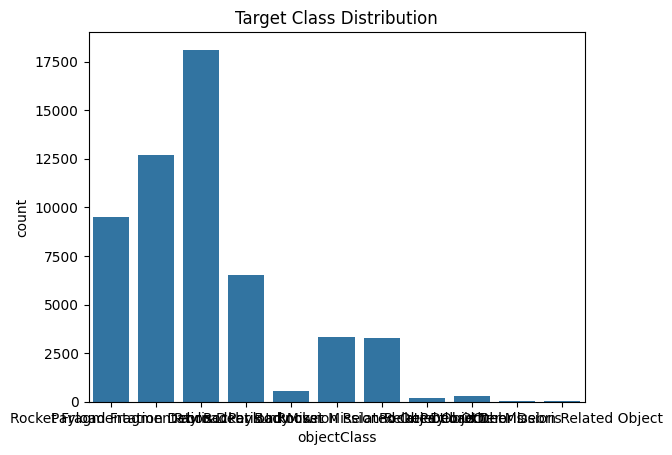

objectClass
Payload                           0.332263
Payload Fragmentation Debris      0.232903
Rocket Fragmentation Debris       0.173985
Rocket Body                       0.119819
Payload Mission Related Object    0.060845
Rocket Mission Related Object     0.059928
Unknown                           0.010551
Payload Debris                    0.005009
Rocket Debris                     0.003266
Other Debris                      0.000771
Other Mission Related Object      0.000661
Name: proportion, dtype: float64


In [36]:
# Checking and addressing class imbalance
sns.countplot(x=y_train)
plt.title("Target Class Distribution")
plt.show()

# Or numerically:
print(y_train.value_counts(normalize=True))


In [39]:
X_train_cleaned.isna().sum().sort_values(ascending=False).head(10)

day                                                      3241
year                                                     3241
month                                                    3241
name_Agena D debris                                         0
name_Cosmos-1408 debris                                     0
name_CZ-6A debris                                           0
name_Blok-I (Soyuz-U)                                       0
name_Cosmos-2251 fragmentation debris                       0
name_Pegasus fourth stage (HAPS) fragmentation debris       0
name_Fengyun 1C debris                                      0
dtype: int64

In [44]:
# Drop rows in X_train_cleaned that contain any NaNs
X_train_cleaned_dropped = X_train_cleaned.dropna()

# Align y_train to match the cleaned X
y_train_dropped = y_train[X_train_cleaned_dropped.index]

print(X_train_cleaned_dropped.shape)
print(y_train_dropped.shape)

(51258, 12)
(51258,)


In [ ]:
# Appling SMOTE to oversample minority classes
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_cleaned_dropped, y_train_dropped)

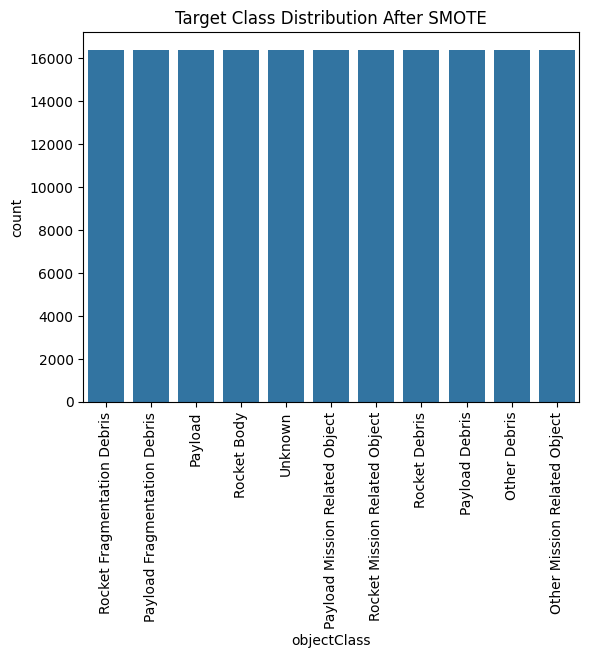

In [46]:
# Visualizing after SMOTE
sns.countplot(x=y_resampled)
plt.title("Target Class Distribution After SMOTE")
plt.xticks(rotation=90)
plt.show()

**ESA Dataset (esa_df)**

1. Why SMOTE?

In the original dataset, the target variable objectClass was highly imbalanced, with certain categories (like "Payload") dominating the dataset while others (like "Other Mission Related Object") had very few samples. This imbalance can cause classification models to be biased toward majority classes, leading to poor performance on minority ones.

To address this, I chose SMOTE (Synthetic Minority Over-sampling Technique), which:

Generates synthetic examples for the minority class by interpolating between neighboring observations

Helps create a balanced training set without simply duplicating minority class rows (which could cause overfitting)

2. Handling Missing Values Before SMOTE

Before applying SMOTE, I needed to handle missing values, because SMOTE does not support NaNs.

I extracted the "year", "month", and "day" from the "firstEpoch" column using:
These three columns had 3,241 missing values, so I dropped these rows.
After dropping missing values I got: 

X_train_cleaned_dropped.shape = (51258, 12)

y_train_dropped.shape = (51258,)

3. Applying SMOTE

I used SMOTE from the imblearn library to balance the training data.
After SMOTE, each class had an equal number of samples (~16,300 per class)

This ensured that the model would not be biased toward any particular object class.

4. Train-Test Split

Before balancing, I split the dataset into training and testing sets to prevent data leakage.

Training set: 80% of the data

Testing set: 20% of the data

Stratified split to maintain class distribution in test set

SMOTE was applied only to the training set to avoid artificially balancing the test set, which should represent real-world class distribution.



**Collision Dataset (collision_df)**

Target Variable is Activity_Status (binary or multiclass 0-3)

In [50]:
collision_df.head()

,NORAD_CAT_ID_1,DSE_1,NORAD_CAT_ID_2,DSE_2,TCA,TCA_RANGE,TCA_RELATIVE_SPEED,MAX_PROB,DILUTION,OBJECT_NAME_1,OBJECT_1_Active,OBJECT_NAME_2,OBJECT_2_Active,Activity_Status
0,48379,7.424,33314,7.726,2025-03-18 10:36:24.650,0.018,6.833,0.243800,0.005,STARLINK2612,1,RAPIDEYE 1,0,1
1,56155,7.671,56156,7.671,2025-03-18 06:42:02.541,0.027,0.001,0.005994,0.006,PIESAT C,1,PIESAT D,1,3
2,45394,6.801,49027,6.104,2025-03-17 13:58:44.363,0.034,10.515,0.077890,0.011,STARLINK1292,1,TIANQI15,1,3
3,40030,7.650,45388,7.710,2025-03-18 12:43:07.735,0.040,10.447,0.057940,0.013,DTUSAT2,1,STARLINK1280,1,3
4,51057,5.305,56205,4.570,2025-03-16 01:29:22.126,0.045,15.169,0.000788,0.029,KEPLER16 (ASTRAEUS),1,FACSAT2,1,3


In [51]:
# Separating target and features
X = collision_df.drop(columns=["Activity_Status"])
y = collision_df["Activity_Status"]

In [52]:
# Converting datetime columns to datetime dtype
for col in ['DSE_1', 'DSE_2', 'TCA']:
    X[col] = pd.to_datetime(X[col], errors='coerce')

In [53]:
# Extracting useful time-based features
for col in ['DSE_1', 'DSE_2', 'TCA']:
    X[f'{col}_year'] = X[col].dt.year
    X[f'{col}_month'] = X[col].dt.month
    X[f'{col}_day'] = X[col].dt.day
    X[f'{col}_hour'] = X[col].dt.hour

In [54]:
# Dropping original datetime columns
X = X.drop(columns=['DSE_1', 'DSE_2', 'TCA'])

In [55]:
# Handling any remaining missing values if they exist
X = X.dropna()

In [56]:
# Making sure that target matches the cleaned features
y = y[X.index]

In [ ]:
# Dropping those columns before training or SMOTE
X = X.drop(columns=['OBJECT_NAME_1', 'OBJECT_NAME_2'])

In [62]:
# Spliting the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

In [63]:
# Balance the training set using SMOTE
sm = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = sm.fit_resample(X_train, y_train)

I dropped "OBJECT_NAME_1" and "OBJECT_NAME_2" because they are string identifiers with high cardinality. These columns do not contribute meaningful numerical information for modeling and are not compatible with SMOTE. After removing them, the remaining features were numeric, enabling us to successfully apply SMOTE to balance the target classes in the training dataset.

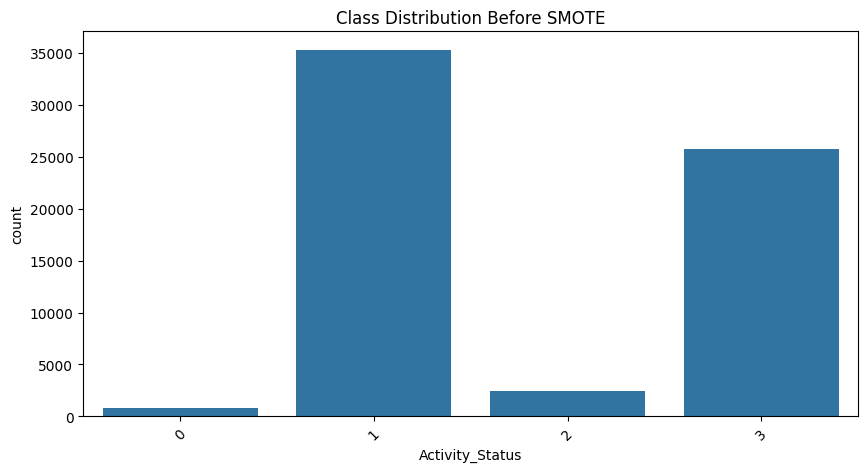

In [ ]:
#  Visualizing before SMOTE
plt.figure(figsize=(10, 5))
sns.countplot(x=y_train)
plt.title("Class Distribution Before SMOTE")
plt.xticks(rotation=45)
plt.show()

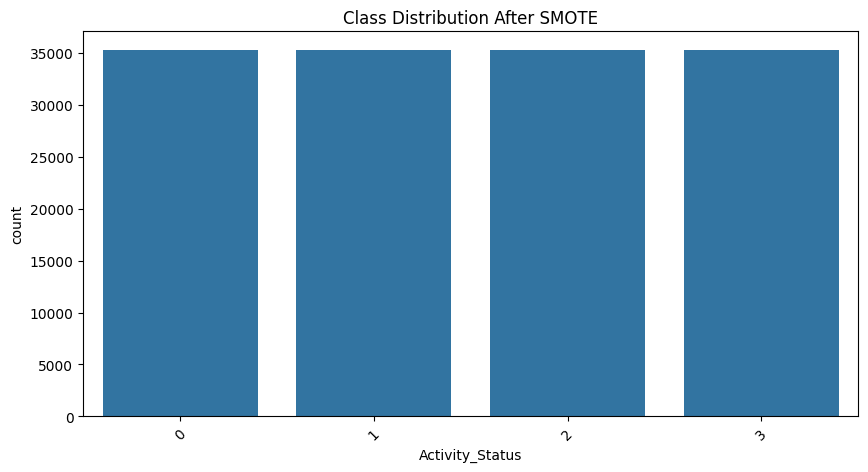

In [65]:
#  Visualizing after SMOTE
plt.figure(figsize=(10, 5))
sns.countplot(x=y_train_resampled)
plt.title("Class Distribution After SMOTE")
plt.xticks(rotation=45)
plt.show()

**Full SATCAT Dataset (full_satcat_df)**

In [66]:
full_satcat_df.head()

,unnamed:_0,object_name,object_id,norad_cat_id,object_type,ops_status_code,owner,launch_date,launch_site,decay_date,period,inclination,apogee,perigee,rcs,orbit_center,orbit_type
0,0,SL-1 R/B,1957-001A,1,R/B,D,CIS,1957-10-04,TYMSC,1957-12-01,96.19,65.10,938.0,214.0,20.4200,EA,IMP
1,1,SPUTNIK 1,1957-001B,2,PAY,D,CIS,1957-10-04,TYMSC,1958-01-03,96.10,65.00,1080.0,64.0,0.0647,EA,IMP
2,2,SPUTNIK 2,1957-002A,3,PAY,D,CIS,1957-11-03,TYMSC,1958-04-14,103.74,65.33,1659.0,211.0,0.0800,EA,IMP
3,3,EXPLORER 1,1958-001A,4,PAY,D,US,1958-02-01,AFETR,1970-03-31,88.48,33.15,215.0,183.0,0.0647,EA,IMP
4,4,VANGUARD 1,1958-002B,5,PAY,Unknown,US,1958-03-17,AFETR,Unknown,132.61,34.25,3822.0,650.0,0.1220,EA,ORB


In [68]:
# Feature and target split
X = full_satcat_df.drop(columns=["ops_status_code"])
y = full_satcat_df["ops_status_code"]

# One-hot encoding for categorical variables
X_encoded = pd.get_dummies(X, drop_first=True)

In [ ]:
#  Train-test split ( stratified split)
X_train, X_test, y_train, y_test = train_test_split(
    X_encoded, y, test_size=0.2, stratify=y, random_state=42
)

In [70]:
# Computing class weights
classes = y_train.unique()
weights = compute_class_weight(class_weight='balanced', classes=classes, y=y_train)
class_weights = dict(zip(classes, weights))

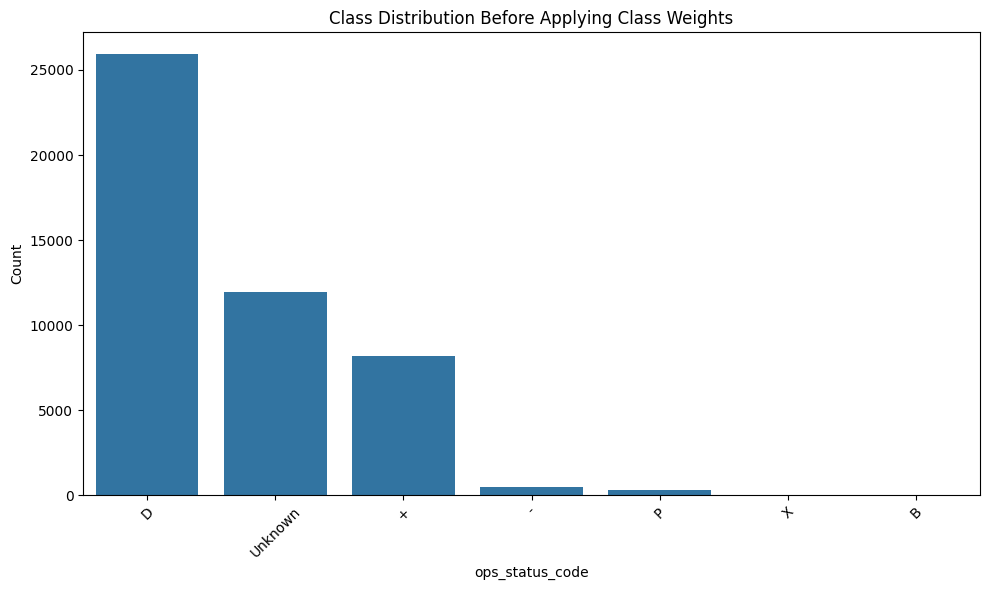

In [71]:
# Visualization before balancing
plt.figure(figsize=(10, 6))
sns.countplot(x=y_train, order=y_train.value_counts().index)
plt.title("Class Distribution Before Applying Class Weights")
plt.xlabel("ops_status_code")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

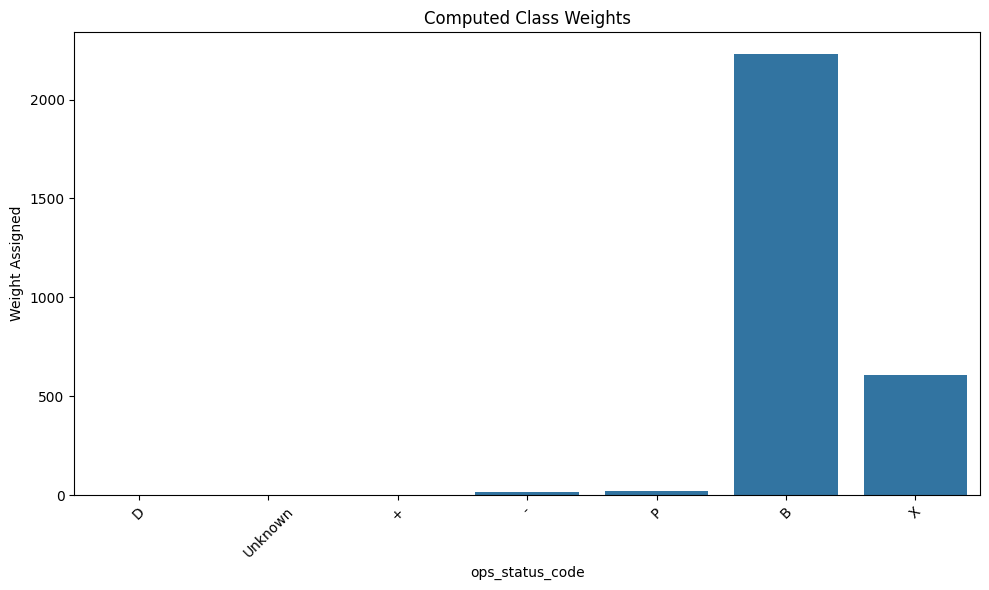

In [72]:
# Visualizing the class weights
weights_df = pd.DataFrame(list(class_weights.items()), columns=["Class", "Weight"])
plt.figure(figsize=(10, 6))
sns.barplot(data=weights_df, x="Class", y="Weight")
plt.title("Computed Class Weights")
plt.xlabel("ops_status_code")
plt.ylabel("Weight Assigned")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

To handle the class imbalance in the ops_status_code target variable, I applied class weighting using sklearn.utils.class_weight.compute_class_weight. This method assigns a higher weight to underrepresented classes and a lower weight to overrepresented ones, ensuring that the learning algorithm doesn’t become biased toward the majority class.

**Why class weights?**

My dataset contains multiple classes with very skewed distributions.

Some classes like 'D' have tens of thousands of samples, while rare classes like 'B' or '+' have only a few dozen.

Using class weights is an effective strategy when having imbalanced multiclass classification and when want to avoid duplicating minority class samples (like in SMOTE).

**Visualization:**

The first plot shows the original distribution of classes in the training set.

The second plot shows the computed weights assigned to each class, giving more importance to underrepresented categories.

**Data Spliting**

I split the data using an 80/20 stratified split, there is why: 

Stratified splitting preserves the original class distribution across training and testing sets.

This ensures the model is trained and evaluated on a balanced representation of all classes, which is especially important in imbalanced classification problems.


**Lost Objects Dataset (lost_objects_df)**

In [30]:
lost_objects_df.head()

,object_id,norad_cat_id,satellite_name,source,launch_date,launch_site,object_type,last_data
0,1960-009D,52.0,ECHO 1 DEB [MYLAR OBJ],US,1960-08-12,AFETR,DEBRIS,1991-03-25 14:23:57.069312
1,1963-039C,692.0,VELA 1,US,1963-10-17,AFETR,PAYLOAD,2024-11-06 17:09:09.800928
2,1964-040A,836.0,OPS 3662 (VELA 3),US,1964-07-17,AFETR,PAYLOAD,2024-10-18 19:49:13.468512
3,1965-058A,1458.0,OPS 6577 (VELA 5),US,1965-07-20,AFETR,PAYLOAD,2025-01-24 09:01:13.708704
4,1965-058B,1459.0,OPS 6564 (VELA 6),US,1965-07-20,AFETR,PAYLOAD,2024-12-24 02:18:46.645344


In [31]:
lost_objects_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2581 entries, 0 to 2580
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   object_id       2581 non-null   object        
 1   norad_cat_id    2581 non-null   float64       
 2   satellite_name  2581 non-null   object        
 3   source          2581 non-null   object        
 4   launch_date     2581 non-null   datetime64[ns]
 5   launch_site     2581 non-null   object        
 6   object_type     2581 non-null   object        
 7   last_data       2579 non-null   datetime64[ns]
dtypes: datetime64[ns](2), float64(1), object(5)
memory usage: 161.4+ KB


In [32]:
# Dropping the rows with missing target
df_cleaned = lost_objects_df.dropna(subset=['object_type'])

In [41]:
print(lost_objects_df['object_type'].value_counts())

object_type
DEBRIS         2492
PAYLOAD          62
ROCKET BODY      25
UNKNOWN           2
Name: count, dtype: int64


In [42]:
# Removing target classes with only 1 occurrence
value_counts = df_cleaned['object_type'].value_counts()
valid_classes = value_counts[value_counts > 1].index
df_cleaned = df_cleaned[df_cleaned['object_type'].isin(valid_classes)]


In [43]:
# Defining X and y
X = df_cleaned.drop(columns=['object_type'])    # Features
y = df_cleaned['object_type']   # Target

# One-hot encoding for categorical features
X_encoded = pd.get_dummies(X, drop_first=True)

In [44]:
#  Applying train-test split with stratification 
X_train, X_test, y_train, y_test = train_test_split(
    X_encoded, y, test_size=0.2, stratify=y, random_state=42
)

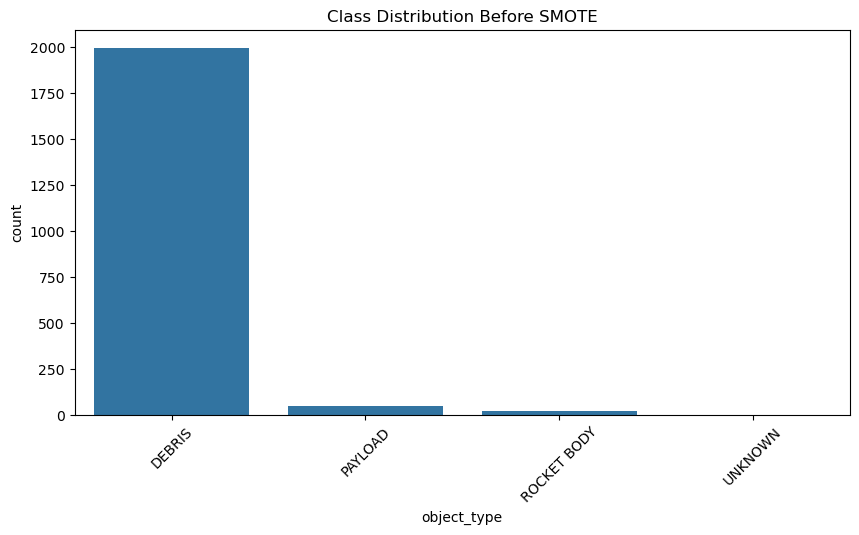

In [45]:
# Checking the distribution before balancing
plt.figure(figsize=(10, 5))
sns.countplot(x=y_train)
plt.title("Class Distribution Before SMOTE")
plt.xticks(rotation=45)
plt.show()

In [46]:
# Checking the number of samples in each class
class_counts = Counter(y_train)
min_class_size = min(class_counts.values())

# If any class has fewer than 6 samples, reduce k_neighbors
k_neighbors = min(5, min_class_size - 1)  # SMOTE needs at least k+1 samples

print(f"Using k_neighbors = {k_neighbors} based on smallest class size = {min_class_size}")

# Apply SMOTE
sm = SMOTE(random_state=42, k_neighbors=k_neighbors)
X_train_resampled, y_train_resampled = sm.fit_resample(X_train, y_train)

Using k_neighbors = 1 based on smallest class size = 2


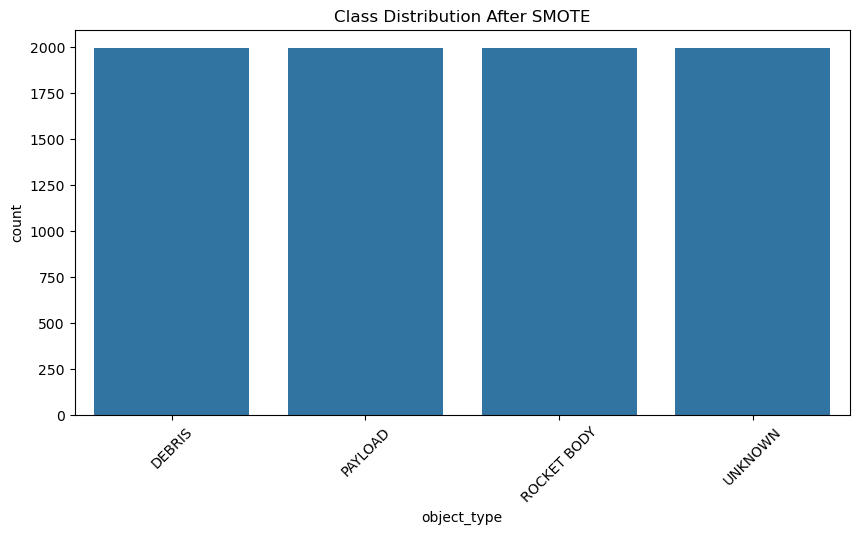

In [47]:
# Visualizing the distribution after SMOTE
plt.figure(figsize=(10, 5))
sns.countplot(x=y_train_resampled)
plt.title("Class Distribution After SMOTE")
plt.xticks(rotation=45)
plt.show()

**LEO Objects Dataset (loe_objects_df)**

In [5]:
loe_objects_df.head()

,object_id,norad_cat_id,object_type,object_name,country,launch_date,launch_site,period,inclination,apogee,perigee,rcs_size
0,1975-052MT,42658,DEBRIS,DELTA 1 DEB,US,1975-06-12,AFWTR,2.003148,1.087033,2.274354,1.279073,SMALL
1,1974-089GR,42624,DEBRIS,THORAD DELTA 1 DEB,US,1974-11-15,AFWTR,1.833673,1.149312,1.429885,2.112430,SMALL
2,1974-089GK,42618,DEBRIS,THORAD DELTA 1 DEB,US,1974-11-15,AFWTR,2.372779,1.192215,1.812612,2.754292,SMALL
3,1970-025SE,42524,DEBRIS,THORAD AGENA D DEB,US,1970-04-08,AFWTR,0.708709,1.086111,0.494056,0.938638,SMALL
4,1970-025RZ,42519,DEBRIS,THORAD AGENA D DEB,US,1970-04-08,AFWTR,0.571376,1.072732,0.360719,0.818067,SMALL


In [6]:
loe_objects_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24062 entries, 0 to 24061
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   object_id     24062 non-null  category      
 1   norad_cat_id  24062 non-null  category      
 2   object_type   24062 non-null  category      
 3   object_name   24062 non-null  category      
 4   country       24062 non-null  category      
 5   launch_date   24062 non-null  datetime64[ns]
 6   launch_site   24062 non-null  category      
 7   period        24062 non-null  float64       
 8   inclination   24062 non-null  float64       
 9   apogee        24062 non-null  float64       
 10  perigee       24062 non-null  float64       
 11  rcs_size      23778 non-null  category      
dtypes: category(7), datetime64[ns](1), float64(4)
memory usage: 2.9 MB


In [7]:
#Dropping missing target values
loe_objects_df = loe_objects_df.dropna(subset=['object_type'])

In [8]:
# Defining target and features
X = loe_objects_df.drop(columns=['object_type', 'launch_date'])
y = loe_objects_df['object_type']

In [9]:
# Encoding categorical features
X_encoded = pd.get_dummies(X, drop_first=True)

In [10]:
# Dropping classes with only 1 sample (required for stratification)
value_counts = y.value_counts()
y_filtered = y[y.isin(value_counts[value_counts > 1].index)]
X_encoded_filtered = X_encoded.loc[y_filtered.index]

In [11]:
# Spliting the data (80% train, 20% test), stratified by class
X_train, X_test, y_train, y_test = train_test_split(
    X_encoded_filtered, y_filtered, test_size=0.2, stratify=y_filtered, random_state=42
)

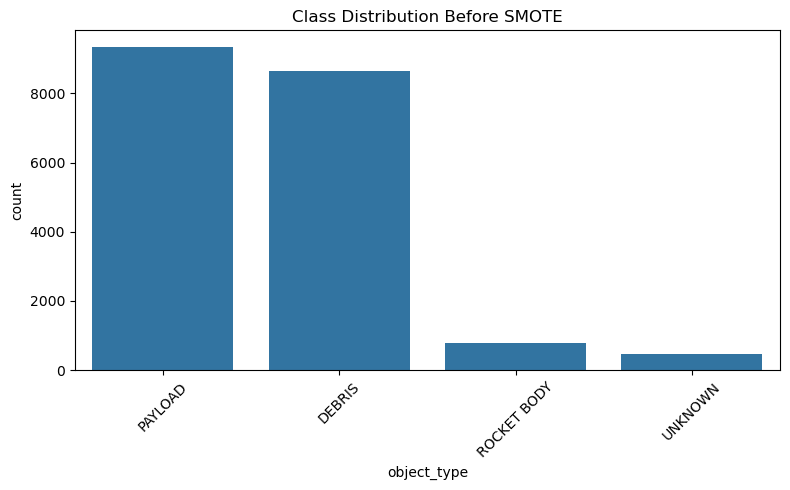

In [12]:
# Visualizing class imbalance BEFORE SMOTE
plt.figure(figsize=(8, 5))
sns.countplot(x=y_train, order=y_train.value_counts().index)
plt.title("Class Distribution Before SMOTE")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
# Applying SMOTE to balance classes in training set
min_class_count = min(Counter(y_train).values())
k_neighbors = min(5, min_class_count - 1)  

sm = SMOTE(random_state=42, k_neighbors=k_neighbors)
X_train_resampled, y_train_resampled = sm.fit_resample(X_train, y_train)

In [17]:
# Visualizing class distribution after SMOTE
plt.figure(figsize=(8, 5))
sns.countplot(x=y_train_resampled, order=pd.Series(y_train_resampled).value_counts().index)
plt.title("Class Distribution After SMOTE")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

NameError: name 'y_train_resampled' is not defined

<Figure size 800x500 with 0 Axes>

In [18]:
# Checking shapes
print("Original Train Shape:", X_train.shape)
print("After SMOTE:", X_train_resampled.shape)

Original Train Shape: (2064, 2859)


NameError: name 'X_train_resampled' is not defined